In [213]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pandas_profiling
import numpy as np

from itertools import combinations
from scipy.stats import ttest_ind

pd.set_option('display.max_rows', 50)  # показывать больше строк
pd.set_option('display.max_columns', 50)  # показывать больше колонок

stud_math = pd.read_csv('stud_math.csv')
display(stud_math.head(10))
stud_math.info()
# вычисление показателей описательной статистики
stud_math.describe()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,"studytime, granular",higher,internet,romantic,famrel,freetime,goout,health,absences,score
0,GP,F,18,U,NaN,A,4.0,4.0,at_home,teacher,course,mother,2.0,2.0,0.0,yes,no,no,no,yes,-6.0,yes,NaN,no,4.0,3.0,4.0,3.0,6.0,30.0
1,GP,F,17,U,GT3,NaN,1.0,1.0,at_home,other,course,father,1.0,2.0,0.0,no,yes,no,no,no,-6.0,yes,yes,no,5.0,3.0,3.0,3.0,4.0,30.0
2,GP,F,15,U,LE3,T,1.0,1.0,at_home,other,other,mother,1.0,2.0,3.0,yes,no,NaN,no,yes,-6.0,yes,yes,NaN,4.0,3.0,2.0,3.0,10.0,50.0
3,GP,F,15,U,GT3,T,4.0,2.0,health,NaN,home,mother,1.0,3.0,0.0,no,yes,yes,yes,yes,-9.0,yes,yes,yes,3.0,2.0,2.0,5.0,2.0,75.0
4,GP,F,16,U,GT3,T,3.0,3.0,other,other,home,father,1.0,2.0,0.0,no,yes,yes,no,yes,-6.0,yes,no,no,4.0,3.0,2.0,5.0,4.0,50.0
5,GP,M,16,U,LE3,T,4.0,3.0,services,other,reputation,mother,1.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,5.0,4.0,2.0,5.0,10.0,75.0
6,GP,M,16,NaN,LE3,T,2.0,2.0,other,other,home,mother,1.0,2.0,0.0,no,no,no,no,yes,-6.0,yes,yes,no,4.0,4.0,4.0,3.0,0.0,55.0
7,GP,F,17,U,GT3,A,4.0,4.0,other,teacher,home,mother,2.0,2.0,0.0,yes,yes,no,no,yes,-6.0,yes,no,no,4.0,1.0,4.0,1.0,6.0,30.0
8,GP,M,15,U,LE3,A,3.0,2.0,services,other,home,mother,1.0,2.0,0.0,no,yes,yes,no,yes,-6.0,yes,yes,no,NaN,2.0,2.0,1.0,0.0,95.0
9,GP,M,15,U,NaN,NaN,3.0,4.0,other,other,home,mother,1.0,2.0,0.0,no,yes,yes,yes,yes,-6.0,yes,yes,no,5.0,5.0,1.0,5.0,0.0,75.0


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   school               395 non-null    object 
 1   sex                  395 non-null    object 
 2   age                  395 non-null    int64  
 3   address              378 non-null    object 
 4   famsize              368 non-null    object 
 5   Pstatus              350 non-null    object 
 6   Medu                 392 non-null    float64
 7   Fedu                 371 non-null    float64
 8   Mjob                 376 non-null    object 
 9   Fjob                 359 non-null    object 
 10  reason               378 non-null    object 
 11  guardian             364 non-null    object 
 12  traveltime           367 non-null    float64
 13  studytime            388 non-null    float64
 14  failures             373 non-null    float64
 15  schoolsup            386 non-null    obj

,age,Medu,Fedu,traveltime,studytime,failures,"studytime, granular",famrel,freetime,goout,health,absences,score
count,395.000000,392.000000,371.000000,367.000000,388.000000,373.000000,388.000000,368.000000,384.000000,387.000000,380.000000,383.000000,389.000000
mean,16.696203,2.750000,2.614555,1.438692,2.038660,0.337802,-6.115979,3.937500,3.231771,3.105943,3.531579,7.279373,52.262211
std,1.276043,1.098127,2.228732,0.694181,0.842078,0.743135,2.526235,0.927277,0.993940,1.115896,1.396019,23.465197,22.919022
min,15.000000,0.000000,0.000000,1.000000,1.000000,0.000000,-12.000000,-1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,16.000000,2.000000,2.000000,1.000000,1.000000,0.000000,-6.000000,4.000000,3.000000,2.000000,3.000000,0.000000,40.000000
50%,17.000000,3.000000,2.000000,1.000000,2.000000,0.000000,-6.000000,4.000000,3.000000,3.000000,4.000000,4.000000,55.000000
75%,18.000000,4.000000,3.000000,2.000000,2.000000,0.000000,-3.000000,5.000000,4.000000,4.000000,5.000000,8.000000,70.000000
max,22.000000,4.000000,40.000000,4.000000,4.000000,3.000000,-3.000000,5.000000,5.000000,5.000000,5.000000,385.000000,100.000000


In [ ]:
'''Общая информация по датасету:
содержит 395 строк, числовых 13 колонок, строковых 7, бинарных 8'''

In [157]:
# запускаю ProfileReport на датасет
pandas_profiling.ProfileReport(stud_math)

In [ ]:
'''Анализирую результаты отчета:

1. school — 2 типа уникальных значений, пропусков значений нет.

2. sex — 2 типа уникальных значений, пропусков значений нет.

3. age — 8 типов уникальных значений, от 15 до 22, пропусков значений нет.

4. address — 2 типа уникальных значений, пропусков значений 17. 
   Возможно стоит заменить на чаще всего встречаемое значение.

5. famsize —  2 типа уникальных значений, пропусков значений 27. Возможно стоит заменить на чаще всего встречаемое значение.

6. Pstatus — 2 типа уникальных значений, пропусков значений 45. Возможно стоит заменить на чаще всего встречаемое значение.

7. Medu — 5 типов уникальных значений, пропусков значений 3. Возможно стоит заменить на медиану.

8. Fedu — 6 типов уникальных значений, пропусков значений 24. Возможно стоит заменить на медиану. 
   Есть значительное отклонение в цифре 40, что означет ошибку в данных. Возможно стоит удалить.

9. Mjob — 5 типов уникальных значений, пропусков значений 19. Возможно стоит заменить на чаще всего встречаемое значение.

10. Fjob — 5 типов уникальных значений, пропусков значений 36. Возможно стоит заменить на чаще всего встречаемое значение.

11. reason — 4 типов уникальных значений, пропусков значений 17. Возможно стоит заменить на чаще всего встречаемое значение.

12. guardian — 3 типов уникальных значений, пропусков значений 31. Возможно стоит заменить на чаще всего встречаемое значение.

13. traveltime — 4 типов уникальных значений, пропусков значений 28. Возможно стоит заменить на медиану.

14. studytime — 4 типов уникальных значений, пропусков значений 7. Возможно стоит заменить на медиану.

15. failures — 4 типов уникальных значений, пропусков значений 22. Возможно стоит заменить на чаще всего встречаемое значение.

16. schoolsup — 2 типа уникальных значений, пропусков значений 9. Возможно стоит заменить на чаще всего встречаемое значение.

17 famsup — 2 типа уникальных значений, пропусков значений 39. Возможно стоит заменить на чаще всего встречаемое значение.

18 paid — 2 типа уникальных значений, пропусков значений 40. Возможно стоит заменить на чаще всего встречаемое значение.

19. activities — 2 типа уникальных значений, пропусков значений 14. Возможно стоит заменить на чаще всего встречаемое значение.

20. nursery — 2 типа уникальных значений, пропусков значений 16. Возможно стоит заменить на чаще всего встречаемое значение.

21. higher — 2 типа уникальных значений, пропусков значений 20. Возможно стоит заменить на чаще всего встречаемое значение.

22. internet — 2 типа уникальных значений, пропусков значений 34. Возможно стоит заменить на чаще всего встречаемое значение.

23. romantic — 2 типа уникальных значений, пропусков значений 31. Возможно стоит заменить на чаще всего встречаемое значение.

24. famrel — 6 типов уникальных значений, пропусков значений 27. Возможно стоит заменить на  медиану. 
   Отклонение = -1, что означет ошибку в данных. Возможно стоит удалить

25. freetime — 5 типов уникальных значений, пропусков значений 11. Возможно стоит заменить на медиану.

26. goout — 5 типов уникальных значений, пропусков значений 8. Возможно стоит заменить на медиану. 

27. health — 5 типов уникальных значений, пропусков значений 15. Возможно стоит заменить на медиану. 

28. absences — 36 типов уникальных значений, пропусков значений 12. Возможно стоит заменить на медиану. 
   Значительное отклонение в значении 385, что может означать скорее всего, ошибку в данных. Возможно стоит удалить

29. score — 18 типов уникальных значений, пропусков значений 6. Возможно стоит удалить, 
так как это основной показатель анализа, меняя его можно неверно увидеть картину происходящего
'''

In [158]:
# удаляю столбец из-за очень сильной корреляции с studytime
stud_math.drop(['studytime, granular'], inplace=True, axis=1)

In [159]:
# пустые значения в числовых полях меняю на медиану
number_cols = ['Medu', 'Fedu', 'traveltime', 'studytime',
               'failures', 'famrel', 'freetime', 'goout', 'health', 'absences']
for column in number_cols:
    mediana = stud_math[column].median()
    for index in stud_math[stud_math[column].isnull()].index:
        stud_math.loc[index, column] = mediana

# пустые значения в баллах меняю на -1 для дальнейшего удаления
stud_math['score'] = stud_math['score'].fillna(-1)

In [161]:
# пустые значения в символьных полях меняю на моду
stud_math.address = stud_math.address.apply(
    lambda x: stud_math.address.mode()[0] if pd.isna(x) else x)
stud_math.famsize = stud_math.famsize.apply(
    lambda x: stud_math.famsize.mode()[0] if pd.isna(x) else x)
stud_math.Pstatus = stud_math.Pstatus.apply(
    lambda x: stud_math.Pstatus.mode()[0] if pd.isna(x) else x)
stud_math.Mjob = stud_math.Mjob.apply(
    lambda x: stud_math.Mjob.mode()[0] if pd.isna(x) else x)
stud_math.Fjob = stud_math.Fjob.apply(
    lambda x: stud_math.Fjob.mode()[0] if pd.isna(x) else x)
stud_math.reason = stud_math.reason.apply(
    lambda x: stud_math.reason.mode()[0] if pd.isna(x) else x)
stud_math.guardian = stud_math.guardian.apply(
    lambda x: stud_math.guardian.mode()[0] if pd.isna(x) else x)

In [ ]:
# пустые значения в бинарных полях меняю на моду
stud_math.schoolsup = stud_math.schoolsup.apply(
    lambda x: stud_math.schoolsup.mode()[0] if pd.isna(x) else x)
stud_math.famsup = stud_math.famsup.apply(
    lambda x: stud_math.famsup.mode()[0] if pd.isna(x) else x)
stud_math.paid = stud_math.paid.apply(
    lambda x: stud_math.paid.mode()[0] if pd.isna(x) else x)
stud_math.activities = stud_math.activities.apply(
    lambda x: stud_math.activities.mode()[0] if pd.isna(x) else x)
stud_math.nursery = stud_math.nursery.apply(
    lambda x: stud_math.nursery.mode()[0] if pd.isna(x) else x)
stud_math.higher = stud_math.higher.apply(
    lambda x: stud_math.higher.mode()[0] if pd.isna(x) else x)
stud_math.internet = stud_math.internet.apply(
    lambda x: stud_math.internet.mode()[0] if pd.isna(x) else x)
stud_math.romantic = stud_math.romantic.apply(
    lambda x: stud_math.romantic.mode()[0] if pd.isna(x) else x)

In [224]:
# заново запускаю отчет для оценки результатов
pandas_profiling.ProfileReport(stud_math)

In [ ]:
'''Оценка взаимодействия между переменными

1. Баллы и возраст
Чаще всего экзамены сдают учащиеся от 15 до 18 лет

2. Баллы и образования матери
У матерей с высшим образованием сдает экзамены большее количество учащихся. Наиболее высокий балл у этой же группы

3. Баллы и образования отца
Образования отца не оказывает особого влияния на результат

4. Баллы и образования отца
Образования отца не оказывает особого влияния на результат

5. Баллы и отношения в семье
Учащиеся с очень плохими отношениями в семье реже сдают экзамены, но особого влияния непосредственно на балл 
этот параметр не оказывает

6. Баллы и свободное время
Нет особого влияния

7. Баллы и прогулки с друзьями
Нет особого влияния

8. Баллы и здоровье
Нет особого влияния

9. Баллы и пропуски
Чем больше пропусков, тем реже сдаются экзамены, после определенного количества пропусков падают баллы
'''

In [179]:
stud_math.corr()  # корреляция

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,health,absences,score
age,1.000000,-0.151523,-0.139851,0.083361,-0.015966,0.209748,0.054773,0.007772,0.114849,-0.063989,0.209223,-0.154280
Medu,-0.151523,1.000000,0.595003,-0.151989,0.079725,-0.239228,-0.011855,0.032947,0.064744,-0.052823,0.030364,0.213097
Fedu,-0.139851,0.595003,1.000000,-0.117202,0.006140,-0.258665,-0.021769,-0.019477,0.051703,0.001120,0.001613,0.121963
traveltime,0.083361,-0.151989,-0.117202,1.000000,-0.108446,0.041373,-0.046545,-0.011521,0.048744,-0.037215,-0.022449,-0.057875
studytime,-0.015966,0.079725,0.006140,-0.108446,1.000000,-0.162471,0.024087,-0.123310,-0.054576,-0.070837,-0.038468,0.112520
failures,0.209748,-0.239228,-0.258665,0.041373,-0.162471,1.000000,-0.009338,0.094661,0.105480,0.076356,0.130416,-0.335618
famrel,0.054773,-0.011855,-0.021769,-0.046545,0.024087,-0.009338,1.000000,0.160965,0.054776,0.097114,0.029413,0.056902
freetime,0.007772,0.032947,-0.019477,-0.011521,-0.123310,0.094661,0.160965,1.000000,0.290241,0.068327,0.032475,0.017820
goout,0.114849,0.064744,0.051703,0.048744,-0.054576,0.105480,0.054776,0.290241,1.000000,-0.014954,0.055718,-0.122514
health,-0.063989,-0.052823,0.001120,-0.037215,-0.070837,0.076356,0.097114,0.068327,-0.014954,1.000000,-0.002001,-0.070935


In [ ]:
'''Оценка корреляции с показателем score

1. Age - очень слабая

2. Medu - слабая

3. Fedu - очень слабая

4. traveltime - очень слабая

5. studytime - очень слабая

6. failures - слабая

7. famrel - очень слабая

8. freetime - очень слабая

9. goout - очень слабая

10. health - очень слабая

11. absences - очень слабая
'''

In [ ]:
'''для модели можно оставить показатели, которые хоть как-то коррелируют между собой:

1. Medu
2. failures
'''

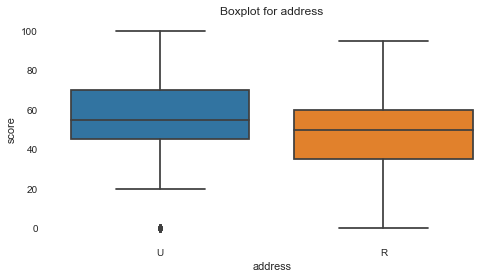

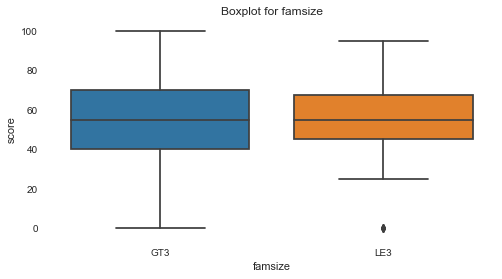

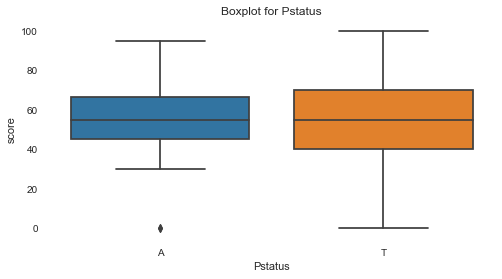

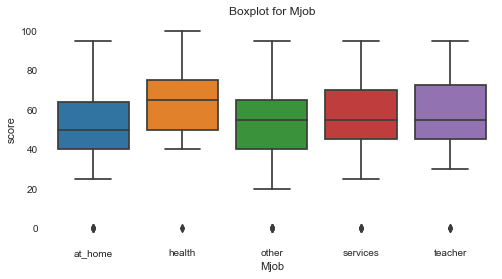

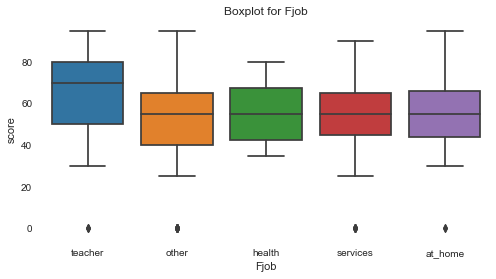

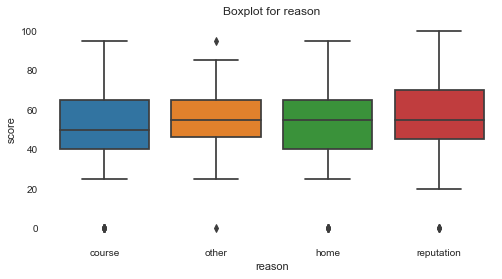

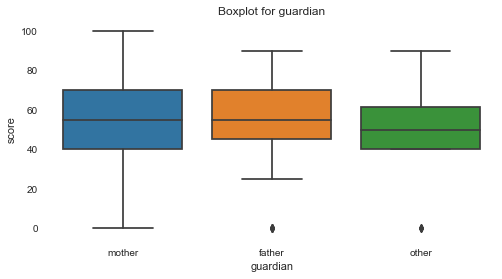

In [232]:
# функция рисования бокс плотов
def get_boxplot(df, column):
    fig, ax = plt.subplots(figsize=(8, 4))
    sns.boxplot(x=column, y='score',
                data=df.loc[df.loc[:, column].isin(
                    df.loc[:, column].value_counts().index[:10])],
                ax=ax)
    ax.set_title('Boxplot for ' + column)
    plt.show()


# для строковых переменных
for col in ['address', 'famsize', 'Pstatus', 'Mjob', 'Fjob', 'reason', 'guardian']:
    get_boxplot(stud_math, col)

In [ ]:
'''согласно полученной диаграммы влияние оказывают следующие показатели
1. address
2. Mjob
3. Fjob
4. guardian
'''

In [208]:
# тест Стьюдента
def get_stat_dif(df, column):
    cols = df.loc[:, column].value_counts().index[:10]
    combinations_all = list(combinations(cols, 2))
    for comb in combinations_all:
        if ttest_ind(df.loc[stud_math.loc[:, column] == comb[0], 'score'],
                     df.loc[stud_math.loc[:, column] == comb[1], 'score']).pvalue \
                <= 0.1/len(combinations_all):  # Учли поправку Бонферони
            print('Найдены статистически значимые различия для колонки', column)
            break


# для строковых переменных
for col in ['address', 'famsize', 'Pstatus', 'Mjob', 'Fjob', 'reason', 'guardian']:
    get_stat_dif(stud_math, col)

Найдены статистически значимые различия для колонки address
Найдены статистически значимые различия для колонки Mjob


In [ ]:
'''после теста Стьюдента оставляю показатели
1. address
2. Mjob
'''

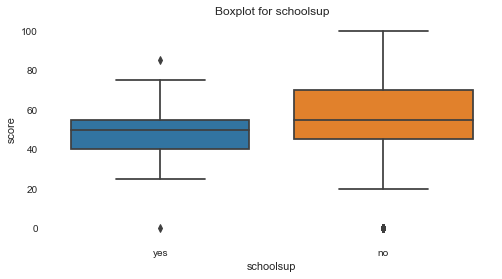

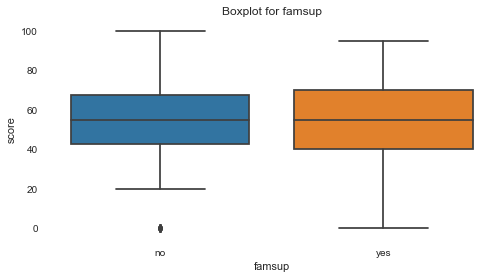

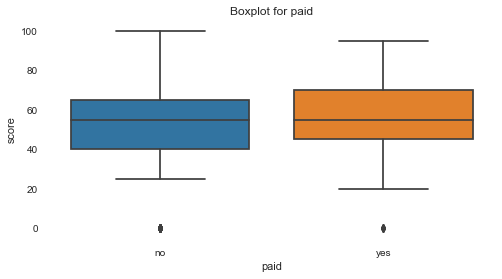

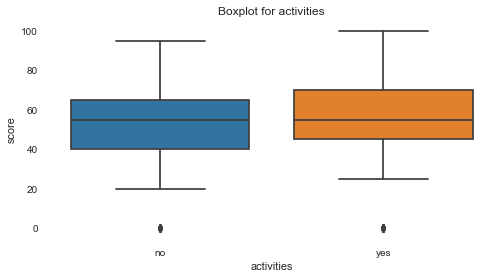

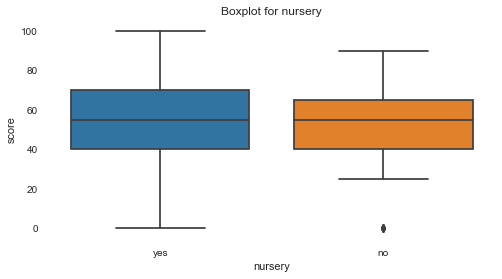

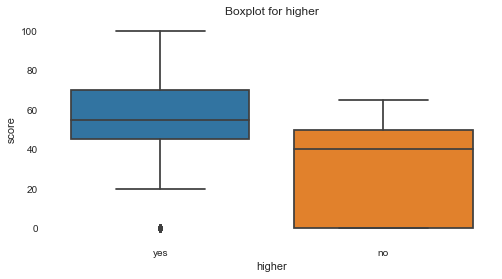

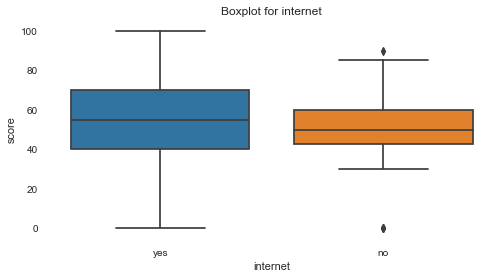

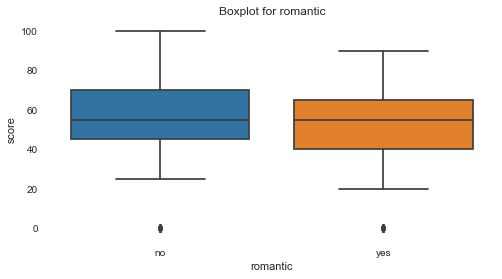

In [233]:
# бокс плоты для бинраных переменных
for col in ['schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']:
    get_boxplot(stud_math, col)

In [ ]:
'''согласно полученной диаграммы влияние оказывают следующие показатели
1. schoolsup
2. higher
3. internet
4. paid
'''

In [210]:
# проверяем тестом Стьюдента
for col in ['schoolsup', 'famsup', 'paid', 'activities', 'nursery', 'higher', 'internet', 'romantic']:
    get_stat_dif(stud_math, col)

Найдены статистически значимые различия для колонки schoolsup
Найдены статистически значимые различия для колонки paid
Найдены статистически значимые различия для колонки higher
Найдены статистически значимые различия для колонки romantic


In [ ]:
'''после теста Стьюдента оставляю показатели
1. schoolsup
2. higher
3. internet
4. paid
'''

In [212]:
# готовлю данные для модели
stud_math_for_model = stud_math.loc[:, [
    'address', 'Mjob', 'schoolsup', 'paid', 'higher', 'romantic', 'Medu', 'failures']]
stud_math_for_model.head()

,address,Mjob,schoolsup,paid,higher,romantic,Medu,failures
0,U,at_home,yes,no,yes,no,4.0,0.0
1,U,at_home,no,no,yes,no,1.0,0.0
2,U,at_home,yes,no,yes,no,1.0,3.0
3,U,health,no,yes,yes,yes,4.0,0.0
4,U,other,no,yes,yes,no,3.0,0.0


In [ ]:
'''Выводы:

В данных достаточно мало пустых значений, что позволяет не выкидывать столбцы из анализа.
Ошибки найдены только в столбцах absences, Fedu, famrel, что позволяет сделать вывод о том, 
что данные достаточно чистые.
Самые важные параметры, которые предлагается использовать в дальнейшем для построения модели, 
это address, Mjob, schoolsup, paid, higher, romantic, Medu, failures.'''